In [1]:
%matplotlib notebook

import numpy as np

plt.rc('font', family='serif')

In [2]:
from multidynet.datasets import load_primaryschool
Y, grade, gender, layer_labels, time_labels = load_primaryschool(reference_layer='Friday')

In [3]:
import joblib

# load fitted models
models = []
for k in range(1, 7):
    models.append(joblib.load(open(
        f'school_model_p{k}.pkl', 'rb')))

## Dimension Selection (Figure 19)

Text(0, 0.5, 'AIC')

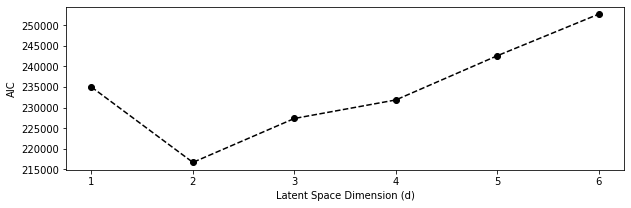

In [3]:
aics = [m.aic_ for m in models]
fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(np.arange(1, 7), aics, 'ko--')
ax.set_xlabel('Latent Space Dimension (d)')
ax.set_ylabel('AIC')

In [4]:
model = models[1]
model.auc_

0.9659293597757539

## Branching Factor (Figure 11)

In [16]:
from multidynet.gof import simulate_univariate_stats

model = models[2]

stat_sim, stat_obs = simulate_univariate_stats(
    model, Y_obs=Y, stats=['branching_factor'], 
    n_sims=500, random_state=1337)

<IPython.core.display.Javascript object>


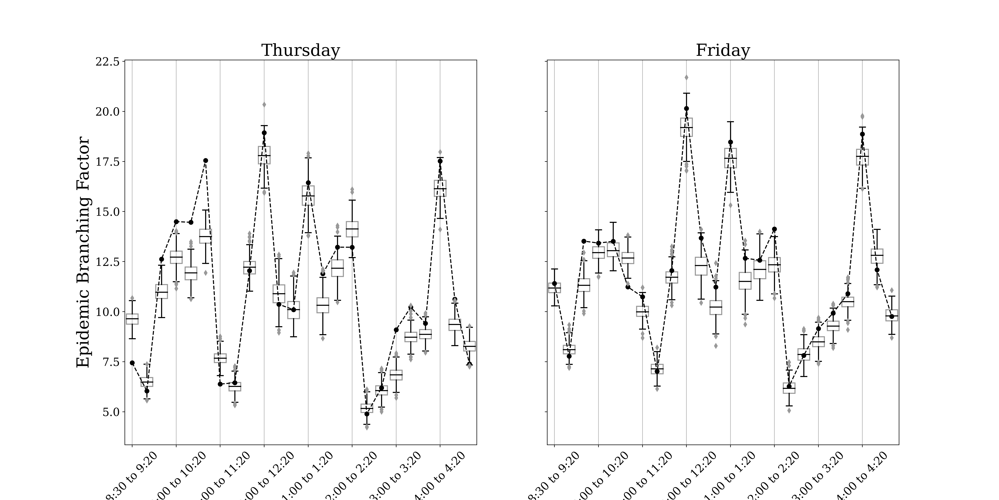

In [6]:
from multidynet.plots import plot_network_statistics

fig, ax = plot_network_statistics(stat_sim[::-1], stat_obs[::-1], 
                                  stat_label='Epidemic Branching Factor',
                                  time_labels=time_labels, 
                                  layer_labels=layer_labels[::-1], 
                                  time_step=3,
                                  figsize=(20, 10),
                                  xlabel='Time Window')

## Latent Space (Figure 12)

/Users/joshua/.pyenv/versions/stats/lib/python3.10/site-packages/statsmodels-0.13.1-py3.10-macosx-12.1-arm64.egg/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


<IPython.core.display.Javascript object>


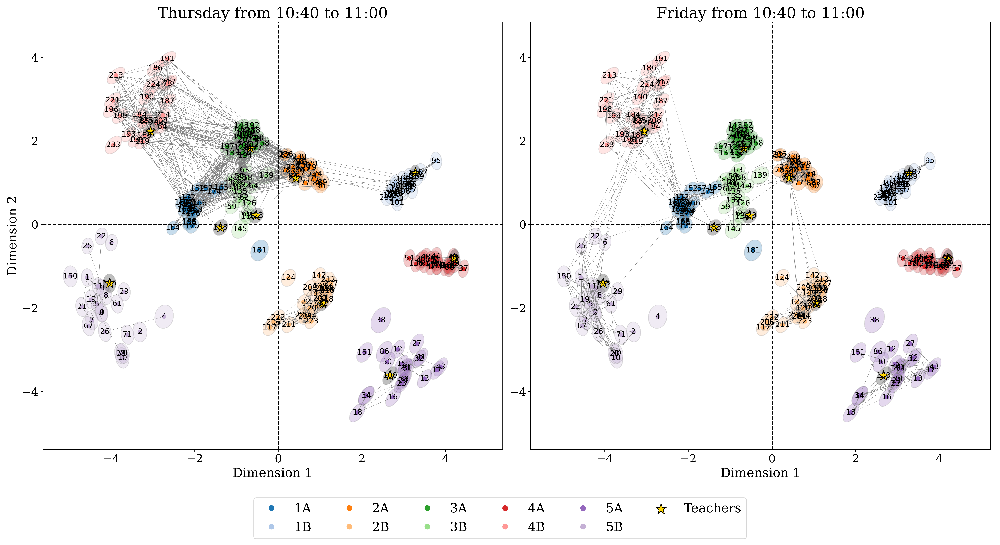

In [5]:
from multidynet.plots import plot_latent_space, normal_contour
from dynetlsm.plots import get_colors
import joblib

t = 5
k = 1

teacher_ids = np.where(grade == 'Teachers')[0]
colors = get_colors(np.arange(10))
colors[1], colors[2] = colors[2], colors[1]
colors[10] = 'black'

fig, ax = plt.subplots(figsize=(22, 12), ncols=2, sharey=True)

plot_latent_space(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t], dims=[0, 1],
                       z=grade, colors=colors,
                      size=50, with_labels=True, font_size=12,
                      edge_width=0.3, figsize=(10, 10), legend_fontsize=16,
                      include_legend=False,
                      ax=ax[0])

ax[0].scatter(model.Z_[t, teacher_ids, 0], model.Z_[t, teacher_ids, 1], marker='*', 
              color='gold', s=300, zorder=2, edgecolor='black', label='Teachers')

ax[0].set_title('{} from {}'.format(layer_labels[k], time_labels[t]), fontsize=24)
ax[0].axhline(0, linestyle='--', color='k')
ax[0].axvline(0, linestyle='--', color='k')
ax[0].tick_params(axis='both', which='major', labelsize=18)
ax[0].set_xlabel(f'Dimension 1', fontsize=20)
ax[0].set_ylabel(f'Dimension 2', fontsize=20)

k = 0
plot_latent_space(Y[k, t], model.Z_[t], X_sigma=model.Z_sigma_[t], dims=[0, 1],
                       z=grade, colors=colors,
                      size=50, with_labels=True, font_size=12,
                      edge_width=0.3, figsize=(10, 10), legend_fontsize=16,
                      include_legend=False,
                      ax=ax[1])
ax[1].scatter(model.Z_[t, teacher_ids, 0], model.Z_[t, teacher_ids, 1], marker='*', 
              color='gold', s=300, zorder=2, edgecolor='black', label='Teachers')
ax[1].set_title('{} from {}'.format(layer_labels[k], time_labels[t]), fontsize=24)
ax[1].axhline(0, linestyle='--', color='k')
ax[1].axvline(0, linestyle='--', color='k')
ax[1].tick_params(axis='both', which='major', labelsize=18)
ax[1].set_xlabel(f'Dimension 1', fontsize=20)

handles, labels = ax[0].get_legend_handles_labels()

# remove old Teachers label
handles = handles[:-2] + handles[-1:]
labels = labels[:-2] + labels[-1:]

fig.legend(handles, labels, loc='lower center', ncol=6, fontsize=20)

fig.tight_layout()
plt.subplots_adjust(bottom=0.175)

# Social Trajectories

## Figure 21

<IPython.core.display.Javascript object>


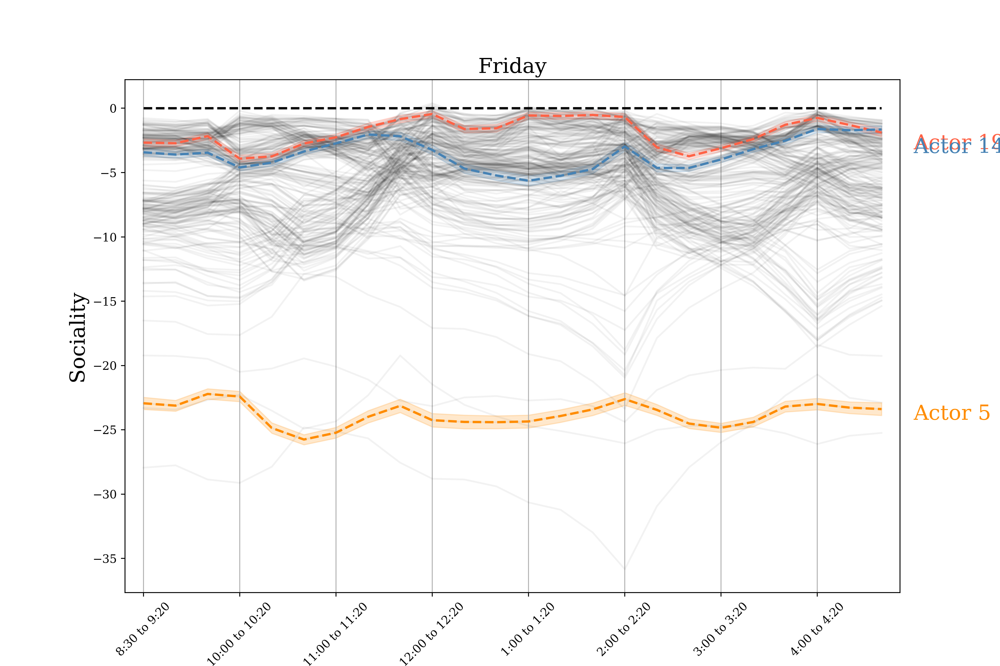

In [6]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 0

fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['Actor 5', 'Actor 195', 'Actor 148'],
                 label_offset=0,
                 q_alpha=0.05, alpha=0.05, fill_alpha=0.2,
                 line_width=2,
                 node_colors=['darkorange', 'tomato', 'steelblue', 'forestgreen'], 
                 layer_label=layer_labels[k], xlabel='Time Window',
                 node_labels=['Actor {}'.format(i + 1) for i in range(Y.shape[2])],
                 figsize=(12, 8), fontsize=18)

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45)
ax.margins(x=0.025)
ax.grid(axis='x')

## Figure 20

<IPython.core.display.Javascript object>


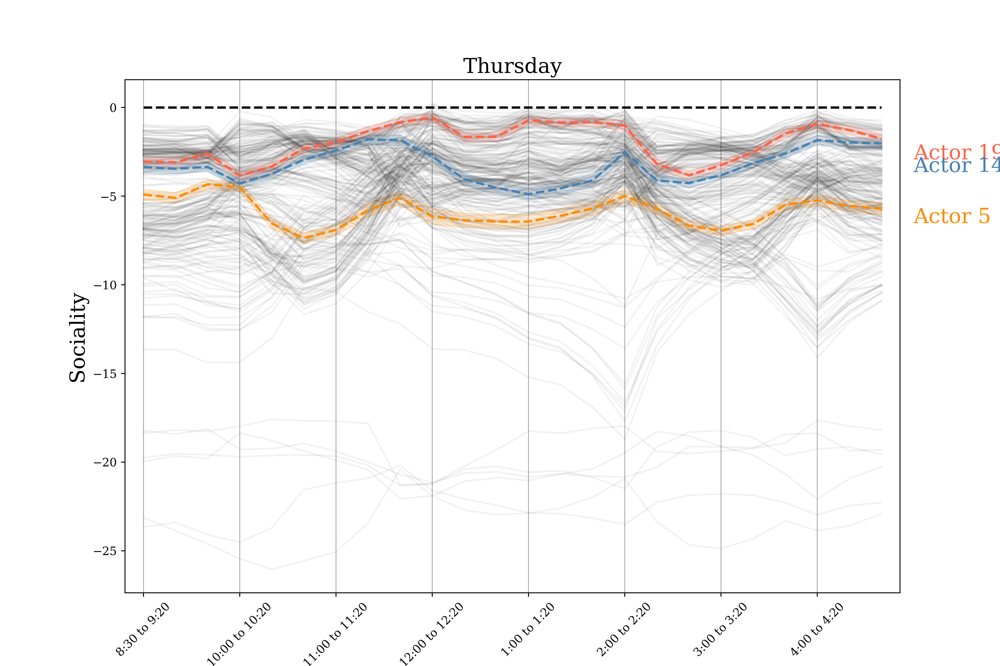

In [7]:
from multidynet.plots import plot_social_trajectories
from scipy.special import logit

k = 1

fig, ax = plot_social_trajectories(model, k=k, 
                 node_list=['Actor 5', 'Actor 195', 'Actor 148'],
                 label_offset=0,
                 q_alpha=0.05, alpha=0.05, fill_alpha=0.2,
                 line_width=2,
                 node_colors=['darkorange', 'tomato', 'steelblue', 'forestgreen'], 
                 layer_label=layer_labels[k], xlabel='Time Window',
                 node_labels=['Actor {}'.format(i + 1) for i in range(Y.shape[2])],
                 figsize=(12, 8), fontsize=18)

ax.set_xticks([i for i in range(0, 24, 3)])
ax.set_xticklabels(time_labels[::3], rotation=45)
ax.margins(x=0.025)
ax.grid(axis='x')

# Homophily Coefficients (Figure 22)

<IPython.core.display.Javascript object>


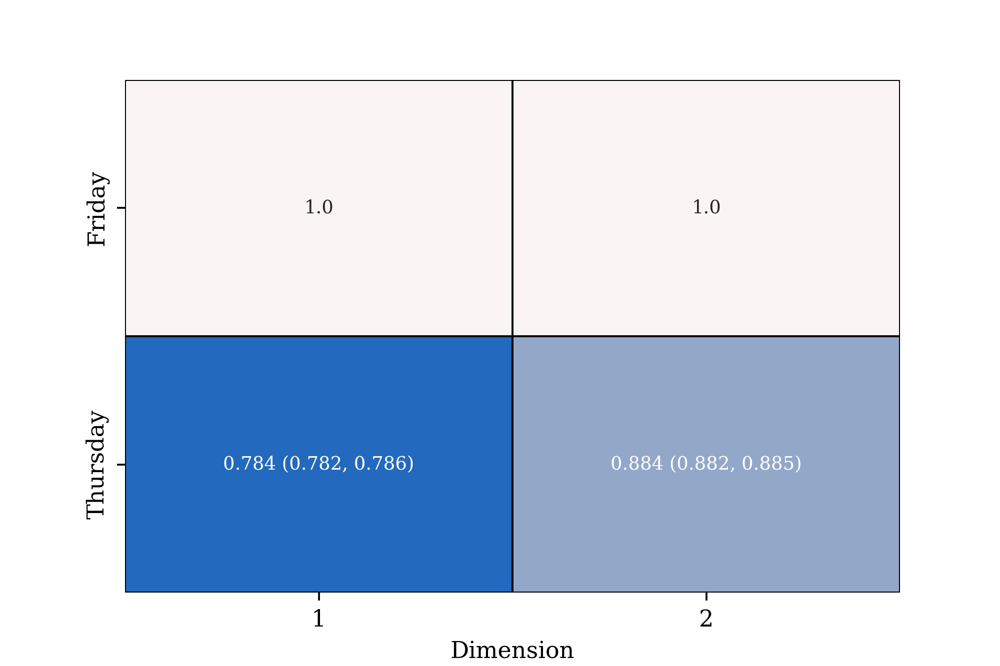

Text(0.5, 14.722222222222216, 'Dimension')

In [9]:
import seaborn as sns
from scipy.stats.distributions import norm

model = models[1]

q_alpha = 0.05
z_alpha = norm.ppf(1 - q_alpha / 2.)

n_layers = model.lambda_.shape[0]
n_features = model.lambda_.shape[1]
labels = []
for k in range(n_layers):
    nums = []
    for p in range(n_features):
        lmbda = model.lambda_[k, p] 
        if k == 0:
            txt = lmbda
        else:
            xerr = z_alpha * np.sqrt(model.lambda_sigma_[:, p, p])
            txt = '{:.3f} ({:.3f}, {:.3f})'.format(
                 lmbda, lmbda - xerr[k], lmbda + xerr[k])
        nums.append(txt)
    labels.append(nums)

fig, ax = plt.subplots(figsize=(6, 4))
g = sns.heatmap(model.lambda_, center=1, fmt='', annot=labels, cmap='vlag', cbar=False,
                annot_kws={"size": 8},linewidths=0.5, linecolor='black',
            yticklabels=layer_labels, xticklabels = [f'{i+1}' for i in range(2)], ax=ax)
g.set_xlabel('Dimension')